# Differential GRNs

## Get differential accessibility for atlas peak matrix

In [1]:
here::i_am("rna/mapping/run/mnn/mapping_mnn.R")

# Load default settings
source(here::here("settings.R"))
source(here::here("utils.R"))

# Load packages
suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(edgeR))
suppressPackageStartupMessages(library(org.Mm.eg.db))


here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/code



In [2]:
args = list()
args$sce = file.path(io$basedir, 'results/atac/archR/pseudobulk/celltype_genotype/PeakMatrix_atlas/PeakMatrix_atlas_pseudobulk_with_replicates.rds')
args$atac_matrix_file = file.path(io$basedir, 'processed/atac/archR/Matrices/PeakMatrix_atlas_summarized_experiment.rds')
args$groupA = 'wt'
args$groupB = 'eomes_ko'
args$celltypes = opts$celltypes
args$outdir = file.path(io$basedir, 'results/atac/archR/differential')

args$archr_directory = file.path(io$basedir, 'processed/atac/archR')
args$metadata = file.path(io$basedir, 'results/atac/archR/qc/sample_metadata_after_qc.txt.gz')

In [3]:

dir.create(args$outdir, showWarnings = F)

# Define groups
opts$groups <- c(args$groupA,args$groupB)

opts$min_cdr <- 0.15

In [ ]:
atac.mtx = readRDS(args$atac_matrix_file)

In [18]:
assayNames(atac.mtx)[1] <- "counts"

In [19]:
###############
## Load data ##
###############

print(sprintf("Fetching ATAC matrix: '%s'...",args$atac_matrix_file))

atac.se <- readRDS(args$sce)
assayNames(atac.se)[1] <- "counts"

# Normalise with log2 counts (for consistentcy with edgeR)
logcounts(atac.se) <- log2(1e6*(sweep(counts(atac.se),2,colSums(counts(atac.se)),"/"))+1)

# parse
if (!"celltype" %in% colnames(colData(atac.se))) {
  atac.se$celltype <- colnames(atac.se) %>% strsplit("-") %>% map_chr(1)
}
if (!"genotype" %in% colnames(colData(atac.se))) {
  atac.se$genotype <- colnames(atac.se) %>% strsplit("-") %>% map_chr(2) %>% strsplit("_rep") %>% map_chr(1)
}
if (!"celltype_genotype" %in% colnames(colData(atac.se))) {
  atac.se$celltype_genotype <- sprintf("%s_%s",atac.se$celltype,atac.se$genotype)
}

# temporary (otherwise subsetting doesn't work???)
if ("start" %in% colnames(rowData(atac.se))) {
  rowData(atac.se)$start <- NULL
}
if ("end" %in% colnames(rowData(atac.se))) {
  rowData(atac.se)$end <- NULL
}

[1] "Fetching ATAC matrix: '/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood/processed/atac/archR/Matrices/PeakMatrix_atlas_summarized_experiment.rds'..."


In [20]:
atac.se_full = atac.se

In [8]:
suppressPackageStartupMessages(library(ArchR))
setwd(args$archr_directory)

addArchRVerbose(verbose = FALSE)
addArchRGenome("mm10")

Setting addArchRVerbose = FALSE

Setting default genome to Mm10.



In [9]:
########################
## Load cell metadata ##
########################

cell_metadata.dt <- fread(args$metadata) %>%
  .[pass_atacQC==TRUE & doublet_call==FALSE]

## Load ArchRProject
# Subset
ArchRProject <- loadArchRProject(args$archr_directory)[cell_metadata.dt$cell]

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\________________,--\\_##,/
           ___      .______        ______  __    __  .____

In [36]:
meta = as.data.table(ArchRProject@cellColData)

features = rownames(atac.mtx)

In [37]:
keep = rownames(ArchRProject@cellColData)

In [38]:
atac.mtx = atac.mtx[,keep]

In [13]:
table(ArchRProject@cellColData$celltype, ArchRProject@cellColData$genotype)

                                
                                 eomes_ko   wt
  Allantois                          2493  720
  Anterior_Primitive_Streak            34  411
  Blood_progenitors_1                   0   86
  Blood_progenitors_2                   0  138
  Caudal_epiblast                      30   19
  Caudal_Mesoderm                       1    2
  Def._endoderm                        29   19
  Endothelium                         222  194
  Epiblast                              2  678
  Erythroid1                            0   91
  Erythroid2                            0    3
  ExE_endoderm                          1    0
  ExE_mesoderm                       3670 1320
  Forebrain_Midbrain_Hindbrain         32   26
  Gut                                  38    5
  Haematoendothelial_progenitors      624 1888
  Intermediate_mesoderm              1010  376
  Mesenchyme                          272 1097
  Mixed_mesoderm                      697 2630
  Nascent_mesoderm         

In [13]:
getAvailableMatrices(ArchRProject)

[1] "DeviationMatrix_CISBP"  "DeviationMatrix_JASPAR" "GeneScoreMatrix_TSS"   
[4] "GeneScoreMatrix_distal" "PeakMatrix"             "PeakMatrix_atlas"      
[7] "TileMatrix"

In [32]:
atac.mtx

class: RangedSummarizedExperiment 
dim: 192251 38757 
metadata(0):
assays(1): counts
rownames(192251): chr1:3035602-3036202 chr1:3062653-3063253 ...
  chrX:169925487-169926087 chrX:169937064-169937664
rowData names(1): idx
colnames(38757): 2_Eo_DEG_G9_day3_5_VC#ATAAGCCTCTTAGGGT-1
  2_Eo_DEG_G9_day3_5_VC#CGTTTGGAGGTCCGTA-1 ...
  2_Eo_DEG_G9_day5_VC#CTCCCTGAGGTGAAAT-1
  2_Eo_DEG_G9_day5_VC#CGCTCCATCATCCTGC-1
colData names(38): BlacklistRatio nDiFrags ... ReadsInPeaks FRIP

In [34]:
test = getMatrixFromProject(ArchRProject, "PeakMatrix_atlas")

In [35]:
test

class: RangedSummarizedExperiment 
dim: 192251 33177 
metadata(0):
assays(1): PeakMatrix_atlas
rownames: NULL
rowData names(1): idx
colnames(33177): 2_Eo_DEG_G9_day3_5_VC#CTACGAAGTGAGCACT-1
  2_Eo_DEG_G9_day3_5_VC#TGGACAAAGCTCAATA-1 ...
  2_Eo_DEG_G9_day5_VC#GACCTTTGTTGCGGAT-1
  2_Eo_DEG_G9_day5_VC#CGCTCCATCATCCTGC-1
colData names(38): BlacklistRatio nDiFrags ... ReadsInPeaks FRIP

In [39]:
DARs = lapply(unique(ArchRProject@cellColData$celltype), function(ct, min_cells=25){ #args$celltypes
    tmp <- sprintf("%s_%s",ct,opts$groups)
    if (nrow(meta[celltype_genotype == paste0(ct, '-eomes_ko')]) < min_cells | nrow(meta[celltype_genotype == paste0(ct, '-wt')]) < min_cells) {
      out <- data.table(Log2FC=NA, Mean=NA, FDR=NA, Pval=NA, MeanDiff=NA, MeanBGD=NA, idx=NA, feature=NA)
      message('skipping ', ct, ' due to low cell number')
    } else {
        
        #stopifnot(opts$groups%in%atac.se$genotype)
        #atac.se$genotype <- factor(atac.se$genotype, levels=opts$groups)
        
        ##################################
        ## calculate feature statistics ##
        ##################################
        # using original single-cell data to determine detection rate

        atac.mtx_tmp <- atac.mtx[,atac.mtx$celltype %in% ct]
        stopifnot(opts$groups%in%atac.mtx_tmp$genotype)
        atac.mtx_tmp$genotype <- factor(atac.mtx_tmp$genotype, levels=opts$groups)
        
        acc.dt <- data.table(
          feature = rownames(atac.mtx_tmp),
          detection_rate_groupA = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[1]]>0) %>% round(2),
          detection_rate_groupB = rowMeans(assay(atac.mtx_tmp,"counts")[,colData(atac.mtx_tmp)$genotype==opts$groups[2]]>0) %>% round(2)
        )
        
        # Consider only features that have a minimum detection rate
        features.to.use <- acc.dt[detection_rate_groupA>=opts$min_cdr | detection_rate_groupB>=opts$min_cdr,feature]
        message(ct, ' with ', length(features.to.use), ' regions')

        #ArchRProject.filt = ArchRProject[ArchRProject@cellColData$celltype==ct,]
        ##########################
        ## Differential testing ##
        ##########################
        
        # sometimes get errors, because of NA's in matrix? but ArchR doesn't allow me to subset the peakmatrix
        out <- suppressMessages(getMarkerFeatures( # suppressMessages(
          ArchRProj = ArchRProject, #.filt, 
          useMatrix = "PeakMatrix_atlas",
          groupBy = "celltype_genotype",
          testMethod = "binomial",
          binarize=TRUE,
          useGroups = paste0(ct, '-eomes_ko'),
          bgdGroups = paste0(ct, '-wt'),
          bias = c("TSSEnrichment", "log10(nFrags)"),
          verbose=TRUE
        ))
        
        # ArchR doesn't allow to select only specified features for differential testing, so instead I run it on everything 
        # Here I select only the relevant features and redo fdr correction.
        out = as.data.table(do.call("cbind", out@assays@data)) %>% 
            setnames(names(out@assays@data)) %>%
            .[,idx:=1:nrow(.)] %>%
            .[,feature := features] %>% 
            .[feature %in% features.to.use,] %>%
            .[,FDR := p.adjust(Pval, method = 'fdr')]
        
        
    }
    out = out %>% .[,celltype:=ct]
    return(out)
}) %>%  rbindlist(.) %>% 
    setnames(c('Log2FC', 'FDR'), c('logFC', 'padj_fdr'))

skipping Epiblast due to low cell number

Primitive_Streak with 45963 regions

Anterior_Primitive_Streak with 57463 regions

Nascent_mesoderm with 45377 regions

Forebrain_Midbrain_Hindbrain with 56491 regions

skipping Rostral_neurectoderm due to low cell number

skipping Def._endoderm due to low cell number

Surface_ectoderm with 44560 regions

skipping Gut due to low cell number

skipping Caudal_epiblast due to low cell number

skipping Visceral_endoderm due to low cell number

Intermediate_mesoderm with 46931 regions

Mixed_mesoderm with 43413 regions

PGC with 46022 regions

ExE_mesoderm with 52539 regions

Haematoendothelial_progenitors with 56621 regions

skipping NMP due to low cell number

Pharyngeal_mesoderm with 53898 regions

skipping Neural_crest due to low cell number

Mesenchyme with 54504 regions

skipping Somitic_mesoderm due to low cell number

skipping Caudal_Mesoderm due to low cell number

skipping Paraxial_mesoderm due to low cell number

Allantois with 48539 regi

In [40]:
fwrite(DARs, file.path(args$outdir, 'DARs_PeakMatrix_atlas.txt.gz'))

## Load eGRN

In [4]:
suppressMessages(library(igraph))
suppressMessages(library(GGally))
suppressMessages(library(igraph))
suppressMessages(library(network))
suppressMessages(library(ggraph))
suppressMessages(library(tibble))
suppressMessages(library(tidygraph))

Warning message:
“package ‘network’ was built under R version 4.1.3”
Warning message:
“package ‘tidygraph’ was built under R version 4.1.3”


In [5]:
scenic_eGRN = fread('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna_atac/gene_regulatory_networks/scenicplus/blood/scenicplus/eRegulon_metadata_filtered.csv')
DARs = fread(file.path(args$outdir, 'DARs_PeakMatrix_atlas.txt.gz')) %>%
    .[,sig:=ifelse(padj_fdr<0.05 & abs(logFC) > 0.5, TRUE, FALSE)]
DEGs = fread(file.path(io$basedir, '/results/rna/differential/DEGs.txt.gz')) %>%
    .[,sig:=ifelse(padj_fdr<0.05 & abs(logFC) > 1, TRUE, FALSE)]

In [6]:
scenic_eGRN_small = scenic_eGRN[,c('TF', 'Region', 'Gene', 'TF2G_rho', 'R2G_rho')] %>% .[Gene %in% TF]

In [7]:
celltype_i = 'ExE_mesoderm'

In [8]:
DARs_tmp = DARs[celltype == celltype_i, c('feature', 'logFC', 'sig')]
DEGs_tmp = DEGs[celltype == celltype_i, c('gene', 'logFC', 'sig')]

In [9]:
nrow(DARs_tmp[sig==TRUE])

[1] 1104

In [10]:
head(scenic_eGRN)

V1,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name
<int>,<chr>,<chr>,<chr>,<lgl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>
0,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,FALSE,chr5:129715191-129715791,Mrps17,0.04739995,0.12114527,0.005742279,0.005742279,1.989913,1,0.1751354,0.3485044,0.3485044,Ahctf1_+_+
1,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,FALSE,chr7:16048053-16048653,Nop53,0.07581570,0.05101828,0.003867987,0.003867987,2.380873,1,0.2166825,0.5158936,0.5158936,Ahctf1_+_+
2,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,FALSE,chr7:16052594-16053194,Nop53,0.02548792,0.08910442,0.002271086,0.002271086,2.380873,1,0.2166825,0.5158936,0.5158936,Ahctf1_+_+
3,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,FALSE,chr14:46788081-46788681,Cdkn3,0.03757410,0.09084517,0.003413426,0.003413426,2.398274,1,0.1058441,0.2538430,0.2538430,Ahctf1_+_+
4,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,FALSE,chr2:145785751-145786351,Naa20,0.10665858,0.08457352,0.009020492,0.009020492,2.526728,1,0.2482450,0.6272477,0.6272477,Ahctf1_+_+
5,Ahctf1_+_(168r),Ahctf1_+_(174g),Ahctf1,FALSE,chr11:94148775-94149375,Luc7l3,0.01717865,0.07555576,0.001297946,0.001297946,2.119917,1,0.4454522,0.9443215,0.9443215,Ahctf1_+_+


In [11]:
scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] & Region %in% DARs_tmp[sig==TRUE, feature]]

In [12]:
nrow(scenic_eGRN_tmp)

[1] 44

In [13]:
scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] & Gene %in% DEGs_tmp[sig==TRUE, gene]| Region %in% DARs_tmp[sig==TRUE, feature] & Gene %in% DEGs_tmp[sig==TRUE, gene]]

In [14]:
nrow(scenic_eGRN_tmp)

[1] 69

In [15]:
TF_region = scenic_eGRN_tmp[,c('TF', 'Region', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
region_gene = scenic_eGRN_tmp[,c('Region', 'Gene', 'R2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
edges = rbind(TF_region, region_gene)

In [16]:
tail(edges)

node,target,TF2G_rho
<chr>,<chr>,<dbl>
chr10:20001828-20002428,Map3k5,0.07606839
chr5:127227820-127228420,Tmem132c,0.13889801
chr6:39787758-39788358,Tmem178b,0.12421047
chr5:75922604-75923204,Kdr,0.51797218
chr5:76016100-76016700,Kdr,0.45400627
chr5:75941653-75942253,Kdr,0.30686810


In [17]:
DAR_DEGs = rbind(DARs_tmp, DEGs_tmp, use.names=FALSE) %>% setnames('feature', 'node')

In [18]:
tail(DAR_DEGs)

node,logFC,sig
<chr>,<dbl>,<lgl>
Zswim5,NA,NA
Zswim9,NA,NA
Zxdb,NA,NA
Zxdc,NA,NA
Zyg11a,NA,NA
ccdc198,NA,NA


In [19]:
edges_tmp = edges %>% #[node %in% c(DARs_tmp$feature, DEGs_tmp$gene)]
    unique(by=c('node', 'target'))

In [20]:
nrow(edges_tmp)
nrow(edges)

[1] 104

[1] 138

In [21]:
test = edges_tmp[, sign:=ifelse(TF2G_rho<0, 'neg', 'pos')]

In [22]:
nodes_tmp = data.table(node = unique(c(edges_tmp$node, edges_tmp$target))) %>%
    .[,type:=ifelse(node %in% scenic_eGRN$TF, 'TF', ifelse(node %in% scenic_eGRN$Region, 'Region', 'gene'))] %>%
    merge(.,DAR_DEGs, by='node', all.x=TRUE) %>%
    .[,logFC:=ifelse(is.na(logFC), 0, logFC)]

In [23]:
summary(nodes_tmp$logFC)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-2.3520 -0.2922  0.0000 -0.1461  0.0000  1.5340 

In [24]:
nrow(nodes_tmp)
nrow(edges_tmp)

[1] 86

[1] 104

In [25]:
igraph.tbl = tbl_graph(edges = edges_tmp, nodes = nodes_tmp)

In [26]:
head(edges_tmp)

node,target,TF2G_rho,sign
<chr>,<chr>,<dbl>,<chr>
Alx4,chr5:127227820-127228420,0.1546882,pos
Cdx1,chr5:127306556-127307156,0.1662269,pos
Cdx2,chr5:127306556-127307156,0.1984865,pos
Cdx4,chr5:127306556-127307156,0.3113791,pos
Eomes,chr10:58714588-58715188,0.2819703,pos
Eomes,chr10:58813252-58813852,0.2819703,pos


In [27]:
head(nodes_tmp)

node,type,logFC,sig
<chr>,<chr>,<dbl>,<lgl>
Ackr3,gene,-1.395,TRUE
Alx4,TF,0.000,NA
Arid5b,TF,-0.411,FALSE
Asb4,gene,-1.665,TRUE
Astn2,gene,1.355,TRUE
Cdx1,TF,0.000,NA


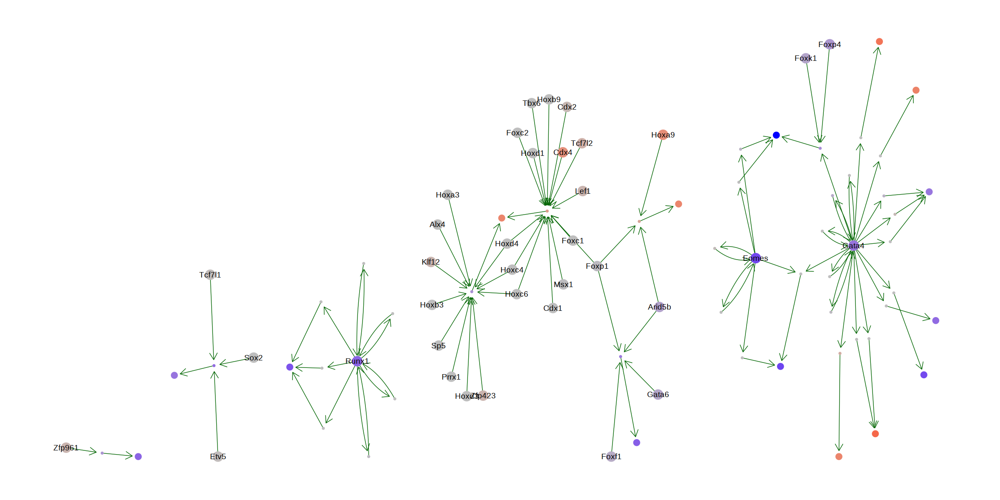

In [28]:
options(repr.plot.width=20, repr.plot.height=10)

ggraph(igraph.tbl, 'stress') +
# Edges
    geom_edge_fan(edge_color = 'darkgreen', edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(3,'mm'), show.legend = T) + 
    theme_graph() + 
    theme(legend.position='none',
         text=element_text(size=20)) +
# nodes
    geom_node_point(aes(color=logFC, size=ifelse(type=='TF', 10, ifelse(type=='Region', 3, 5)))) + 
    scale_colour_gradient2(low='blue', mid='gray', high='red') +
    geom_node_text(aes(filter=type=='TF', label=node))


In [29]:
head(scenic_eGRN_tmp)

V1,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name
<int>,<chr>,<chr>,<chr>,<lgl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>
20,Alx4_+_(63r),Alx4_+_(36g),Alx4,FALSE,chr5:127227820-127228420,Tmem132c,0.01594433,0.1388980,0.002214636,0.002214636,0.7277529,1,0.1546882,0.11257476,0.11257476,Alx4_+_+
166,Cdx1_+_(207r),Cdx1_+_(94g),Cdx1,FALSE,chr5:127306556-127307156,Tmem132c,0.09265904,0.4979043,0.046135329,0.046135329,0.4473581,1,0.1662269,0.07436297,0.07436297,Cdx1_+_+
165,Cdx2_+_(447r),Cdx2_+_(171g),Cdx2,FALSE,chr5:127306556-127307156,Tmem132c,0.09265904,0.4979043,0.046135329,0.046135329,1.4468611,1,0.1984865,0.28718234,0.28718234,Cdx2_+_+
139,Cdx4_+_(300r),Cdx4_+_(152g),Cdx4,FALSE,chr5:127306556-127307156,Tmem132c,0.09265904,0.4979043,0.046135329,0.046135329,16.2215293,1,0.3113791,5.05104579,5.05104579,Cdx4_+_+
101,Eomes_+_(339r),Eomes_+_(228g),Eomes,FALSE,chr10:58714588-58715188,Sh3rf3,0.06334862,0.2265394,0.014350958,0.014350958,9.5528402,1,0.2819703,2.69361730,2.69361730,Eomes_+_+
102,Eomes_+_(339r),Eomes_+_(228g),Eomes,FALSE,chr10:58813252-58813852,Sh3rf3,0.04975327,0.2454766,0.012213264,0.012213264,9.5528402,1,0.2819703,2.69361730,2.69361730,Eomes_+_+


In [30]:
scenic_eGRN_tmp[,.N,by="TF"][N>=3,TF]

[1] "Eomes" "Gata4" "Runx1" "Foxp1"

In [19]:
plotDGRN = function(celltype_i, return_network=FALSE, keep_all=FALSE, DAR_logFC=0.5, DEG_logFC=1, subset_TF=c(NA)){
    DARs_tmp = DARs[celltype == celltype_i, c('feature', 'logFC', 'padj_fdr', 'sig')] %>%
        .[,sig:=ifelse(padj_fdr<0.05 & abs(logFC) > DAR_logFC, TRUE, FALSE)]
    
    DEGs_tmp = DEGs[celltype == celltype_i, c('gene', 'logFC', 'padj_fdr', 'sig')] %>%
        .[,sig:=ifelse(padj_fdr<0.05 & abs(logFC) > DEG_logFC, TRUE, FALSE)]
    
  #  scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] & Region %in% DARs_tmp[sig==TRUE, feature]] %>%
  #       .[TF %in% .[,.N,by="TF"][N>=3,TF]] # keep only TFs with 3 or more targets differential
    scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] & Gene %in% DEGs_tmp[sig==TRUE, gene]| Region %in% DARs_tmp[sig==TRUE, feature] & Gene %in% DEGs_tmp[sig==TRUE, gene]]%>%
        .[TF %in% .[,.N,by="TF"][N>=3,TF]] %>% .[Gene!=TF] # keep only TFs with 3 or more targets differential
       
    if(keep_all==FALSE){
        scenic_eGRN_tmp = scenic_eGRN_tmp %>% unique(by=c('TF','Gene'))    
    }
    
    if(!is.na(subset_TF[1])){
        scenic_eGRN_tmp = scenic_eGRN_tmp[TF %in% subset_TF]
    }    
    
    # Get edges
    TF_region = scenic_eGRN_tmp[,c('TF', 'Region', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
    region_gene = scenic_eGRN_tmp[,c('Region', 'Gene', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
    edges = rbind(TF_region, region_gene)
    
    DAR_DEGs = rbind(DARs_tmp, DEGs_tmp, use.names=FALSE) %>% setnames('feature', 'node')
    
    edges_tmp = edges %>% #[node %in% c(DARs_tmp$feature, DEGs_tmp$gene)] 
        unique(by=c('node', 'target'))
    
    # Get nodes
    nodes_tmp = data.table(node = unique(c(edges_tmp$node, edges_tmp$target))) %>%
        .[,type:=ifelse(node %in% scenic_eGRN$TF, 'TF', ifelse(node %in% scenic_eGRN$Region, 'Region', 'gene'))] %>%
        merge(.,DAR_DEGs, by='node', all.x=TRUE) %>%
        .[,logFC:=ifelse(is.na(logFC), 0, logFC)] %>%
        .[,size:=as.numeric(ifelse(type=='TF', 10, ifelse(type=='Region', 2, 3)))]
    
    if(return_network){
        network = list(edges=edges_tmp,nodes= nodes_tmp)
        return(network)
    }
    
    nodes_tmp = nodes_tmp %>%
        .[,logFC:=ifelse(logFC<=-3, -3, ifelse(logFC>=3, 3, logFC))]

    
    igraph.tbl = tbl_graph(edges = edges_tmp, nodes = nodes_tmp)
    

    ggraph(igraph.tbl, 'lgl') +
    # Edges
        geom_edge_fan(edge_color = 'darkgreen', edge_width=0.1, arrow=arrow(length=unit(4,'mm')), end_cap=circle(3,'mm'), show.legend = T) + 
    # nodes
        geom_node_point(aes(color=logFC, size=size))+ #ifelse(type=='TF', 3, ifelse(type=='Region', 1, 2)))) + 
        scale_colour_gradient2(low='blue', mid='gray90', high='red') +
        geom_node_text(aes(filter=type=='TF', label=node)) +
        scale_size(range = c(2,10)) +
        guides(size = 'none')  +  
    ggtitle(celltype_i) + 
    theme_graph() + 
    theme(#legend.position='none',
        text=element_text(size=20)) 
        
}

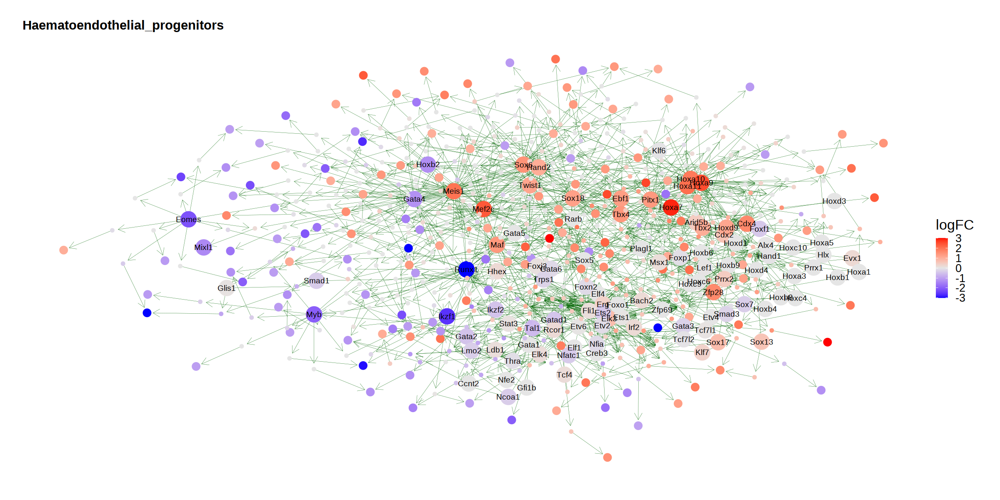

In [20]:
plotDGRN('Haematoendothelial_progenitors', DAR_logFC=0.5, DEG_logFC=1)

In [160]:
png(file.path(args$outdir, 'Prim_streak_dGRN.png'), width=1200, height=800)
    plotDGRN('Primitive_Streak', DAR_logFC=0.5, DEG_logFC=1)
dev.off()

png(file.path(args$outdir, 'Nascent_mesoderm.png'), width=1200, height=800)
    plotDGRN('Nascent_mesoderm', DAR_logFC=0.5, DEG_logFC=1)
dev.off()

png(file.path(args$outdir, 'Mixed_mesoderm.png'), width=1200, height=800)
    plotDGRN('Mixed_mesoderm', DAR_logFC=0.5, DEG_logFC=1)
dev.off()

png(file.path(args$outdir, 'Endothelium.png'), width=1200, height=800)
    plotDGRN('Endothelium', DAR_logFC=0.5, DEG_logFC=1)
dev.off()


png 
  2

png 
  2

png 
  2

png 
  2

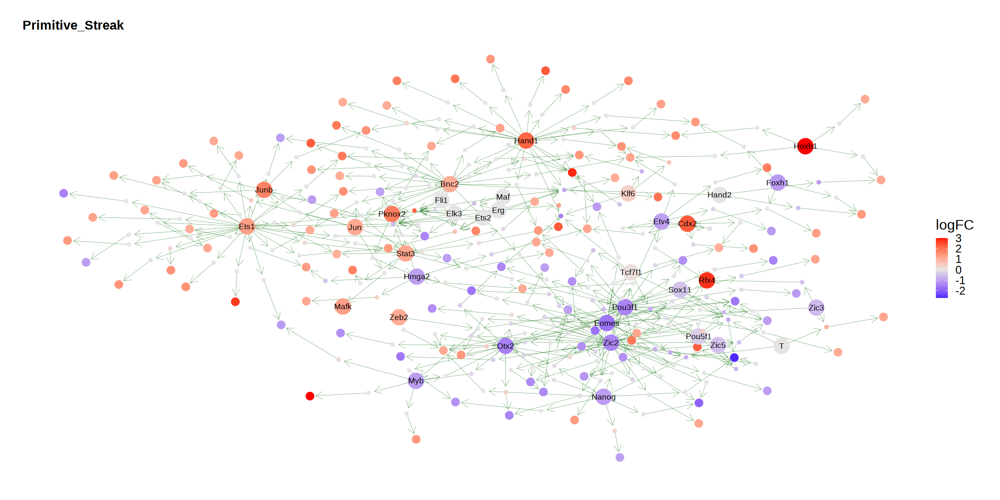

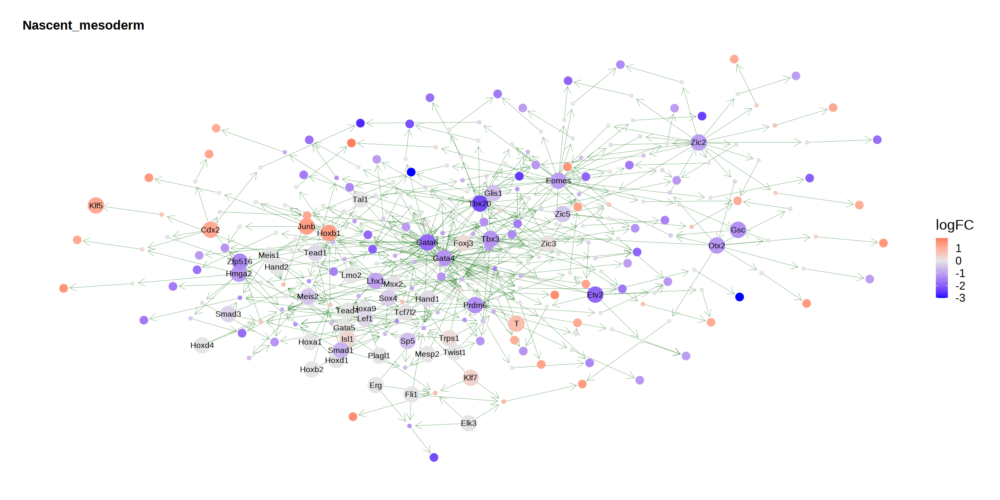

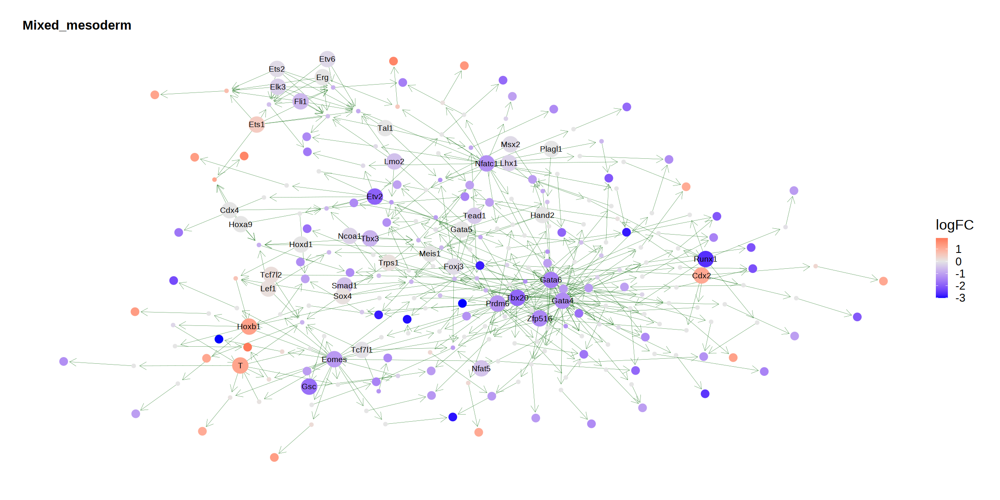

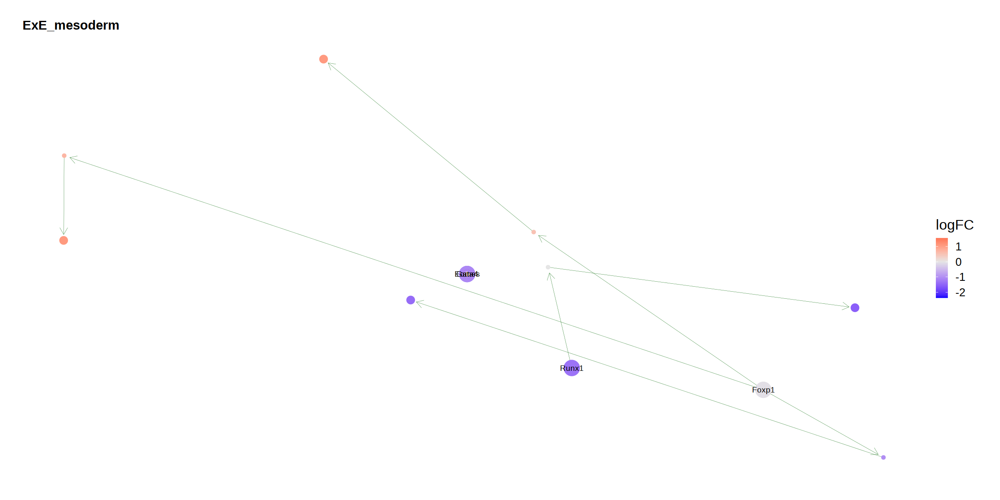

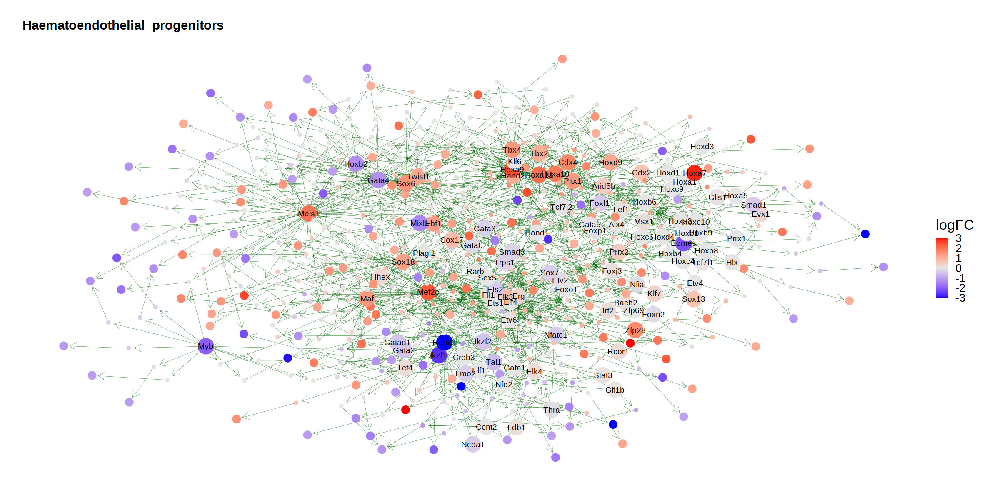

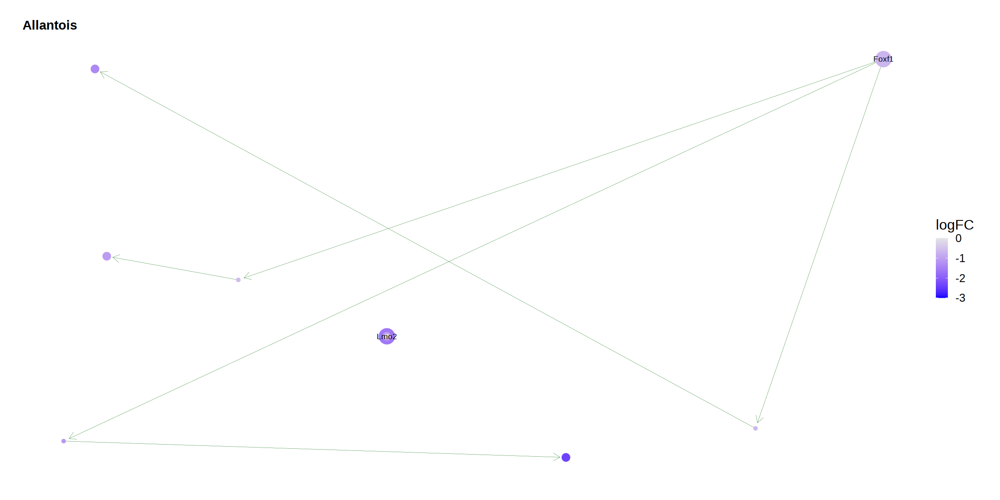

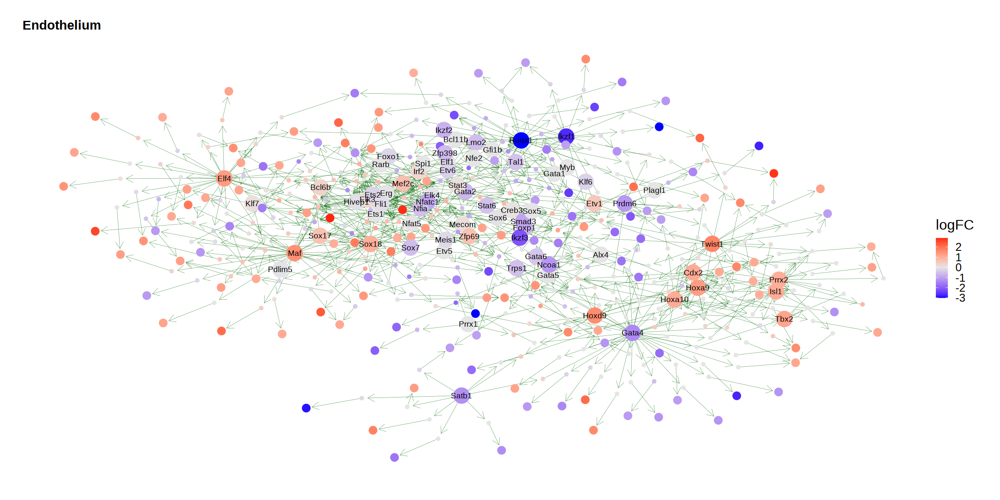

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]


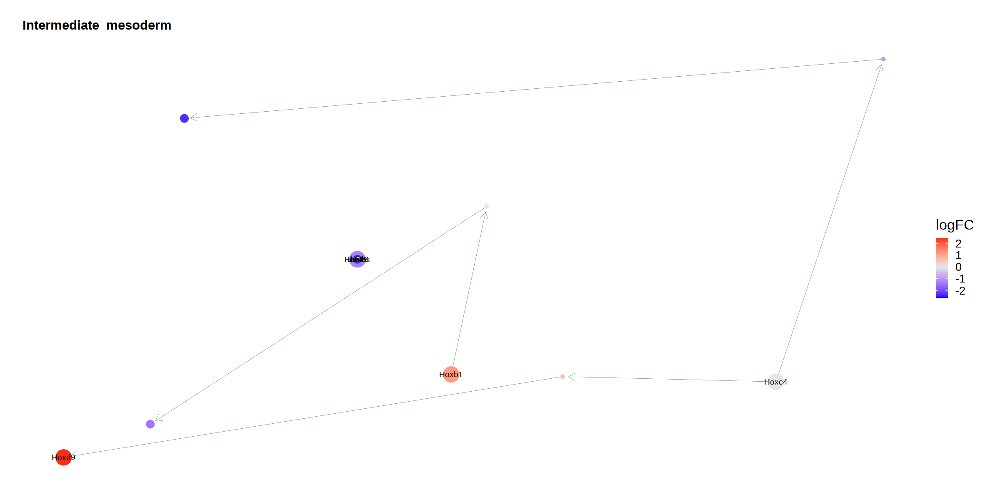

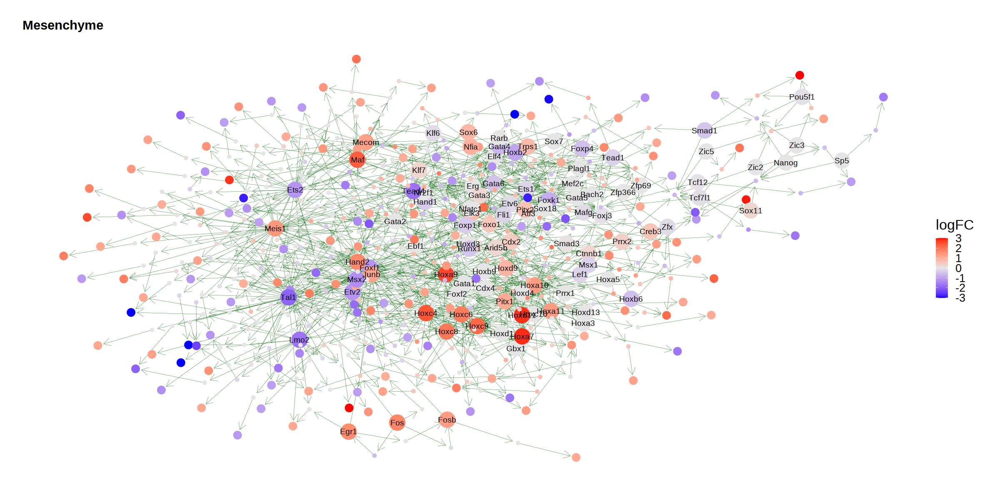

In [21]:
ct_keep = c( 'Primitive_Streak', 'Nascent_mesoderm', 'Mixed_mesoderm', 'ExE_mesoderm', 'Haematoendothelial_progenitors',  'Allantois','Endothelium','Intermediate_mesoderm',  'Mesenchyme')
lapply(ct_keep, plotDGRN, DAR_logFC=0.5, DEG_logFC=1, keep_all=FALSE )

In [24]:
plotDGRN = function(celltype_i, return_network=FALSE, keep_all=FALSE, DAR_logFC=0.5, DEG_logFC=1, subset_TF=c(NA)){
    DARs_tmp = DARs[celltype == celltype_i, c('feature', 'logFC', 'padj_fdr', 'sig')] %>%
        .[,sig:=ifelse(padj_fdr<0.05 & abs(logFC) > DAR_logFC, TRUE, FALSE)]
    
    DEGs_tmp = DEGs[celltype == celltype_i, c('gene', 'logFC', 'padj_fdr', 'sig')] %>%
        .[,sig:=ifelse(padj_fdr<0.05 & abs(logFC) > DEG_logFC, TRUE, FALSE)]
      
    scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] | Region %in% DARs_tmp[sig==TRUE, feature]] %>%
             .[TF %in% .[,.N,by="TF"][N>=10,TF]] # keep only TFs with 3 or more targets differential
    
  #  scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] & Region %in% DARs_tmp[sig==TRUE, feature]] %>%
  #       .[TF %in% .[,.N,by="TF"][N>=3,TF]] # keep only TFs with 3 or more targets differential
  #  scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] & Gene %in% DEGs_tmp[sig==TRUE, gene]| Region %in% DARs_tmp[sig==TRUE, feature] & Gene %in% DEGs_tmp[sig==TRUE, gene]]%>%
  #      .[TF %in% .[,.N,by="TF"][N>=3,TF]] %>% .[Gene!=TF] # keep only TFs with 3 or more targets differential
       
    if(keep_all==FALSE){
        scenic_eGRN_tmp = scenic_eGRN_tmp %>% unique(by=c('TF','Gene'))    
    }
    
    if(!is.na(subset_TF[1])){
        scenic_eGRN_tmp = scenic_eGRN_tmp[TF %in% subset_TF]
    }    
    
    # Get edges
    TF_region = scenic_eGRN_tmp[,c('TF', 'Region', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
    region_gene = scenic_eGRN_tmp[,c('Region', 'Gene', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
    edges = rbind(TF_region, region_gene)
    
    DAR_DEGs = rbind(DARs_tmp, DEGs_tmp, use.names=FALSE) %>% setnames('feature', 'node')
    
    edges_tmp = edges %>% #[node %in% c(DARs_tmp$feature, DEGs_tmp$gene)] 
        unique(by=c('node', 'target'))
    
    # Get nodes
    nodes_tmp = data.table(node = unique(c(edges_tmp$node, edges_tmp$target))) %>%
        .[,type:=ifelse(node %in% scenic_eGRN$TF, 'TF', ifelse(node %in% scenic_eGRN$Region, 'Region', 'gene'))] %>%
        merge(.,DAR_DEGs, by='node', all.x=TRUE) %>%
        .[,logFC:=ifelse(is.na(logFC), 0, logFC)] %>%
        .[,size:=as.numeric(ifelse(type=='TF', 10, ifelse(type=='Region', 2, 3)))]
    
    if(return_network){
        network = list(edges=edges_tmp,nodes= nodes_tmp)
        return(network)
    }
    
    nodes_tmp = nodes_tmp %>%
        .[,logFC:=ifelse(logFC<=-3, -3, ifelse(logFC>=3, 3, logFC))]

    
    igraph.tbl = tbl_graph(edges = edges_tmp, nodes = nodes_tmp)
    
    options(repr.plot.width=20, repr.plot.height=10)

    ggraph(igraph.tbl, 'lgl') +
    # Edges
        geom_edge_fan(edge_color = 'darkgreen', edge_width=0.1, arrow=arrow(length=unit(4,'mm')), end_cap=circle(3,'mm'), show.legend = T) + 
    # nodes
        geom_node_point(aes(color=logFC, size=size))+ #ifelse(type=='TF', 3, ifelse(type=='Region', 1, 2)))) + 
        scale_colour_gradient2(low='blue', mid='gray90', high='red') +
        geom_node_text(aes(filter=type=='TF', label=node)) +
        scale_size(range = c(2,10)) +
        guides(size = 'none')  +  
    ggtitle(celltype_i) + 
    theme_graph() + 
    theme(#legend.position='none',
        text=element_text(size=20)) 
        
}

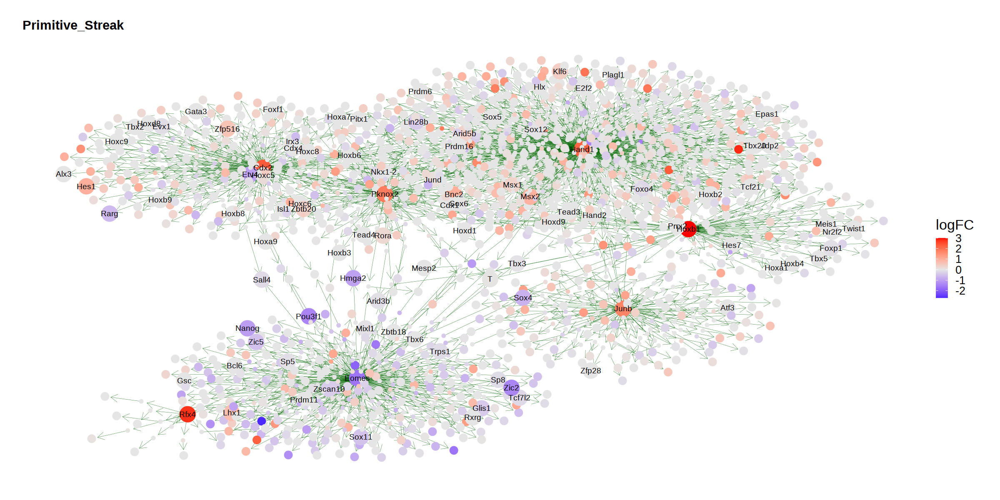

In [30]:
options(repr.plot.width=14, repr.plot.height=10)
plotDGRN('Primitive_Streak',  DAR_logFC=1.5, DEG_logFC=1.5)

In [36]:
plotDGRN = function(celltype_i, return_network=FALSE, keep_all=FALSE, DAR_logFC=0.5, DEG_logFC=1, subset_TF=c(NA)){
    DARs_tmp = DARs[celltype == celltype_i, c('feature', 'logFC', 'padj_fdr', 'sig')] %>%
        .[,sig:=ifelse(padj_fdr<0.05 & abs(logFC) > DAR_logFC, TRUE, FALSE)]
    
    DEGs_tmp = DEGs[celltype == celltype_i, c('gene', 'logFC', 'padj_fdr', 'sig')] %>%
        .[,sig:=ifelse(padj_fdr<0.05 & abs(logFC) > DEG_logFC, TRUE, FALSE)]
    
    scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] & Region %in% DARs_tmp[sig==TRUE, feature]] %>%
         .[TF %in% .[,.N,by="TF"][N>=3,TF]] # keep only TFs with 3 or more targets differential
  #  scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] & Gene %in% DEGs_tmp[sig==TRUE, gene]| Region %in% DARs_tmp[sig==TRUE, feature] & Gene %in% DEGs_tmp[sig==TRUE, gene]]%>%
  #      .[TF %in% .[,.N,by="TF"][N>=3,TF]] %>% .[Gene!=TF] # keep only TFs with 3 or more targets differential
       
    if(keep_all==FALSE){
        scenic_eGRN_tmp = scenic_eGRN_tmp %>% unique(by=c('TF','Gene'))    
    }
    
    if(!is.na(subset_TF[1])){
        scenic_eGRN_tmp = scenic_eGRN_tmp[TF %in% subset_TF]
    }    
    
    # Get edges
    TF_region = scenic_eGRN_tmp[,c('TF', 'Region', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
    region_gene = scenic_eGRN_tmp[,c('Region', 'Gene', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
    edges = rbind(TF_region, region_gene)
    
    DAR_DEGs = rbind(DARs_tmp, DEGs_tmp, use.names=FALSE) %>% setnames('feature', 'node')
    
    edges_tmp = edges %>% #[node %in% c(DARs_tmp$feature, DEGs_tmp$gene)] 
        unique(by=c('node', 'target'))
    
    # Get nodes
    nodes_tmp = data.table(node = unique(c(edges_tmp$node, edges_tmp$target))) %>%
        .[,type:=ifelse(node %in% scenic_eGRN$TF, 'TF', ifelse(node %in% scenic_eGRN$Region, 'Region', 'gene'))] %>%
        merge(.,DAR_DEGs, by='node', all.x=TRUE) %>%
        .[,logFC:=ifelse(is.na(logFC), 0, logFC)] %>%
        .[,size:=as.numeric(ifelse(type=='TF', 10, ifelse(type=='Region', 2, 3)))]
    
    if(return_network){
        network = list(edges=edges_tmp,nodes= nodes_tmp)
        return(network)
    }
    
    nodes_tmp = nodes_tmp %>%
        .[,logFC:=ifelse(logFC<=-3, -3, ifelse(logFC>=3, 3, logFC))]

    
    igraph.tbl = tbl_graph(edges = edges_tmp, nodes = nodes_tmp)
    

    ggraph(igraph.tbl, 'fr') +
    # Edges
        geom_edge_fan(edge_color = 'darkgreen', edge_width=0.1, arrow=arrow(length=unit(4,'mm')), end_cap=circle(3,'mm'), show.legend = T) + 
    # nodes
        geom_node_point(aes(color=logFC, size=size))+ #ifelse(type=='TF', 3, ifelse(type=='Region', 1, 2)))) + 
        scale_colour_gradient2(low='blue', mid='gray90', high='red') +
        geom_node_text(aes(filter=type=='TF', label=node)) +
        scale_size(range = c(2,10)) +
        guides(size = 'none')  +  
    ggtitle(celltype_i) + 
    theme_graph() + 
    theme(#legend.position='none',
        text=element_text(size=20)) 
        
}

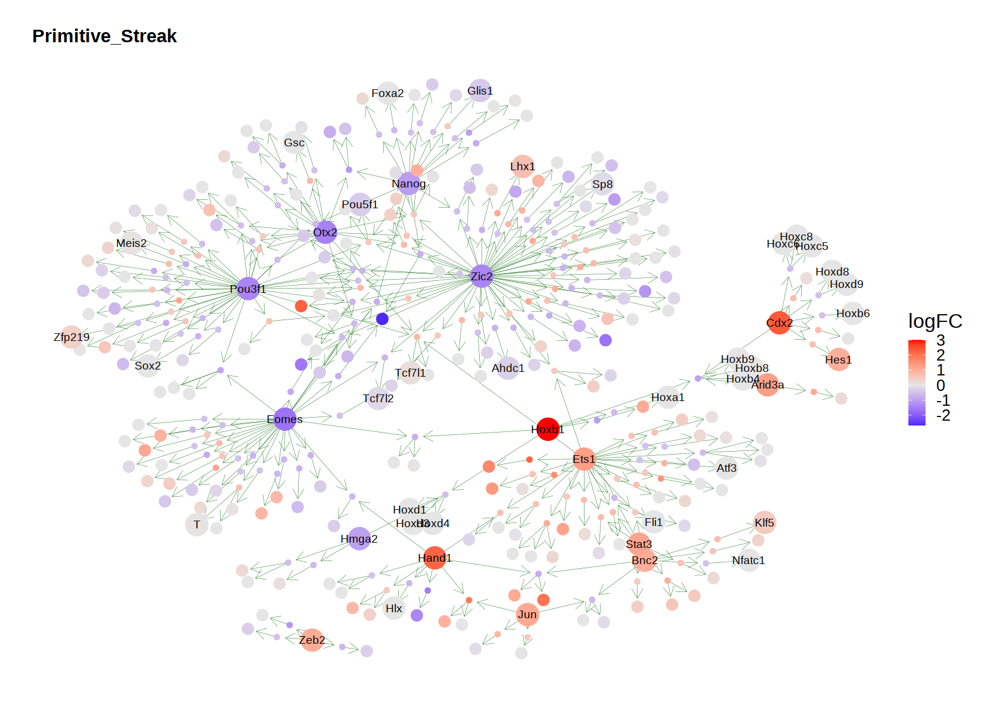

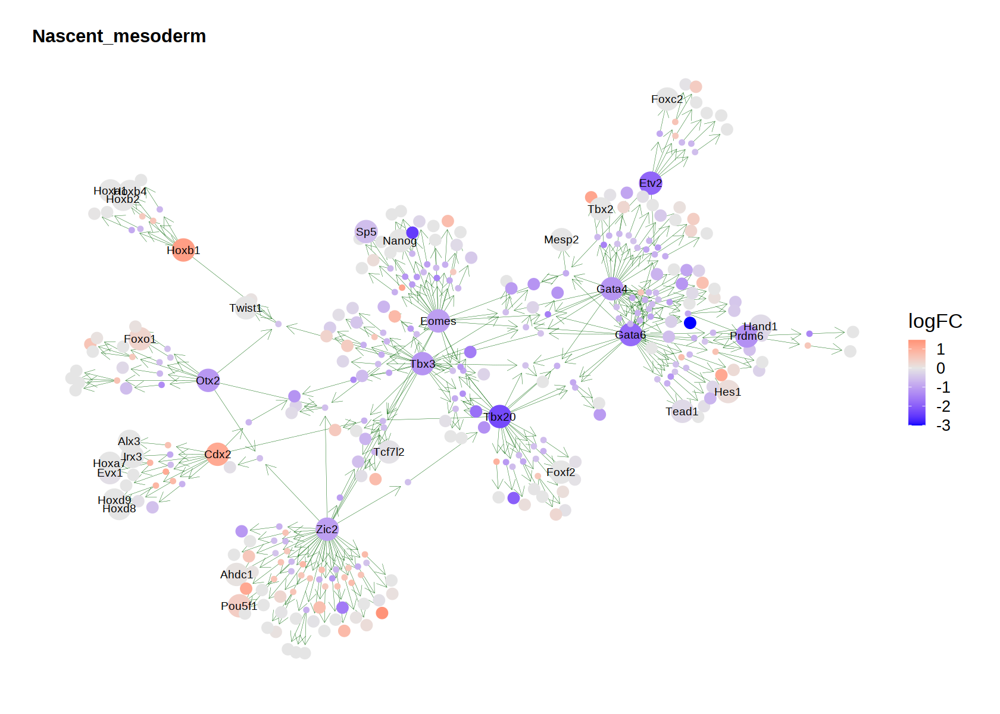

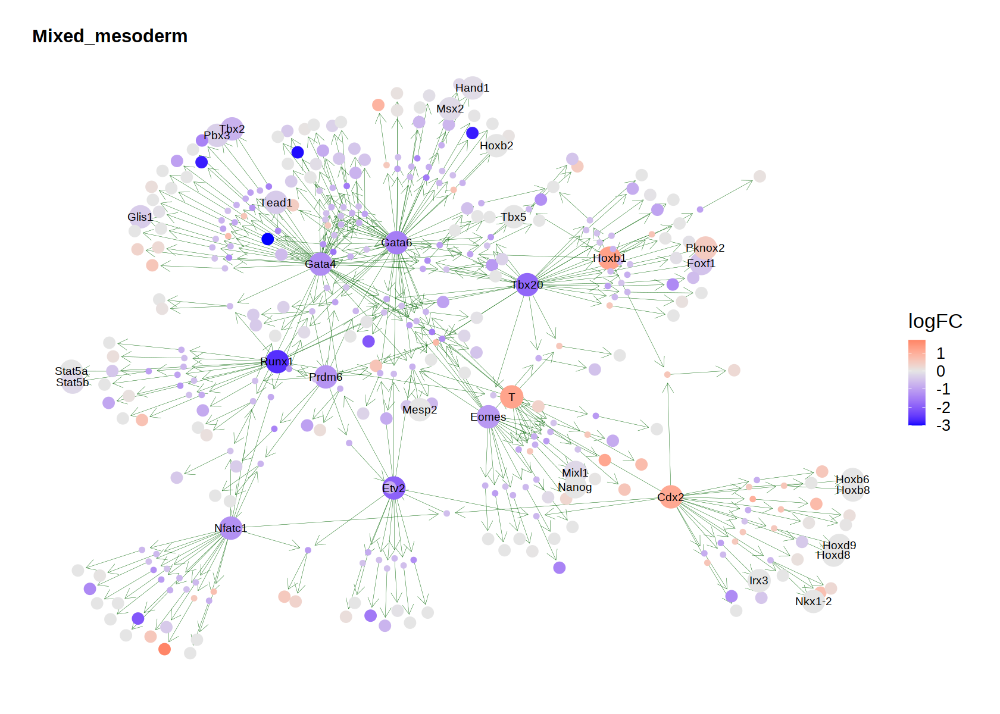

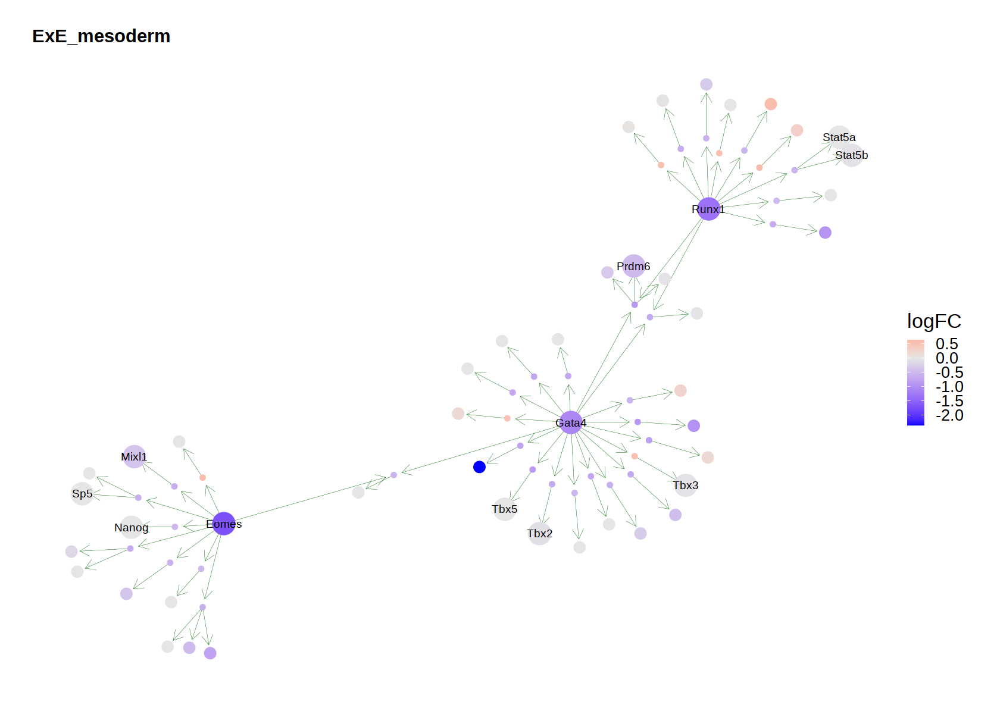

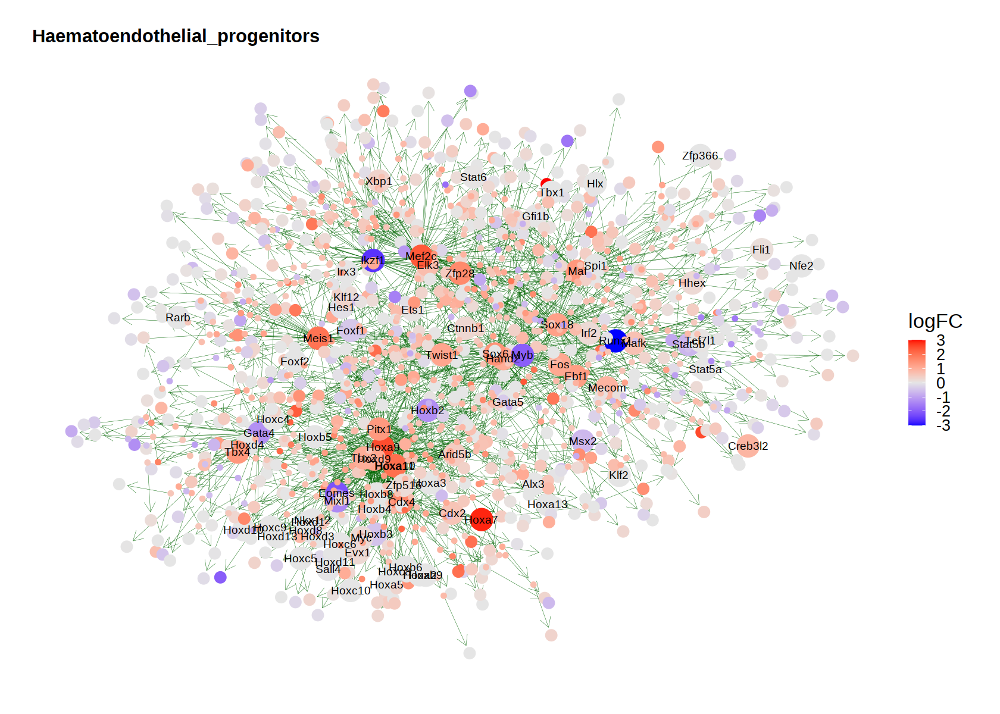

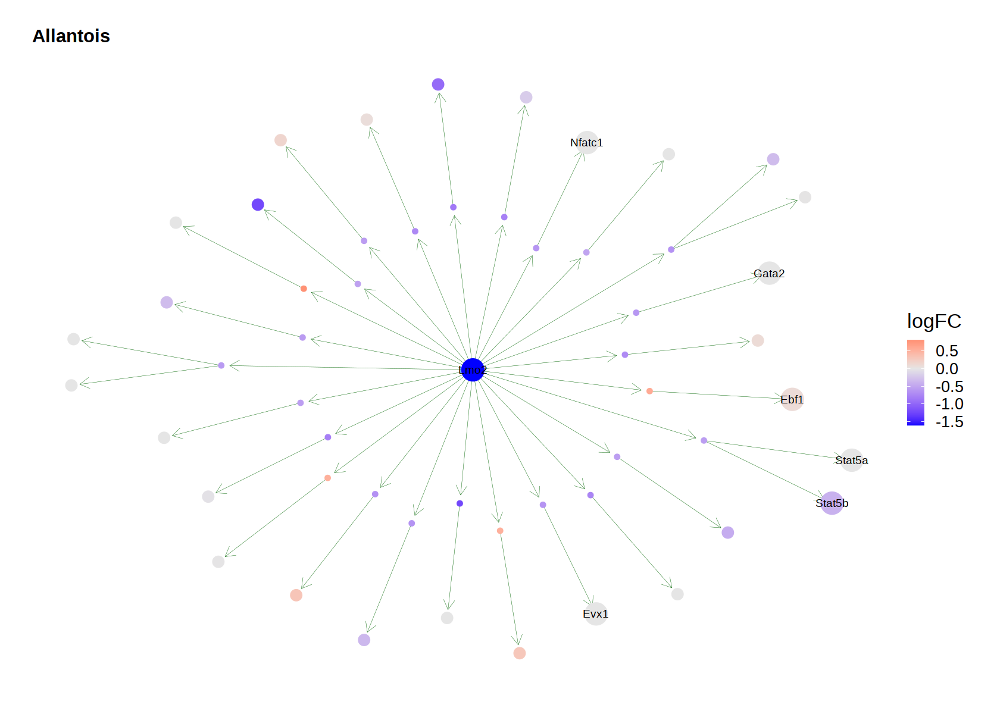

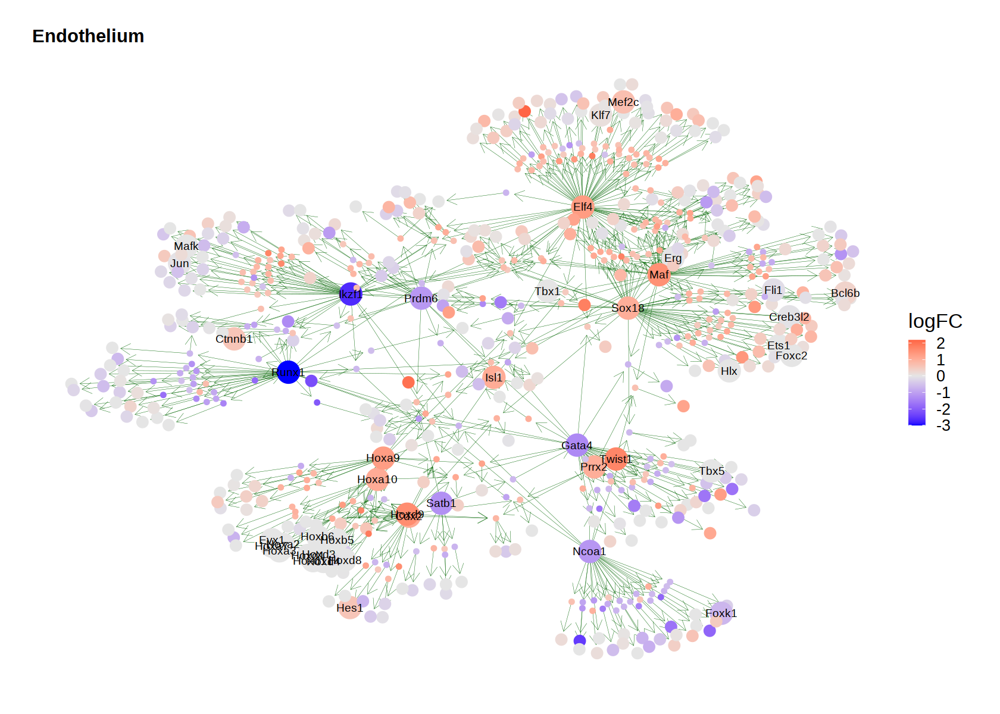

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]


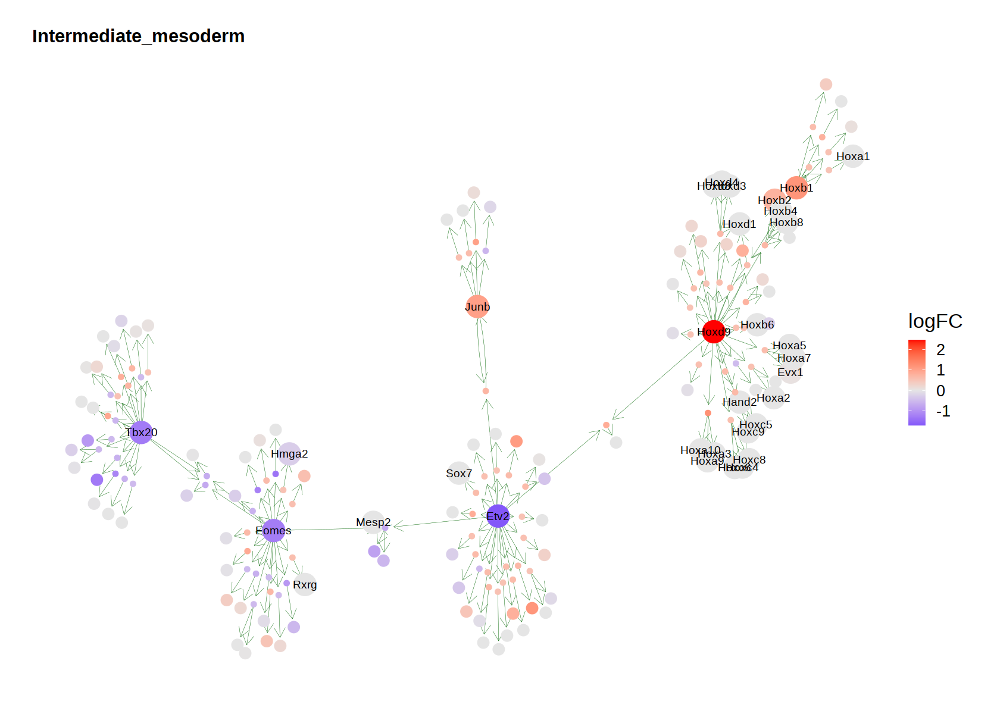

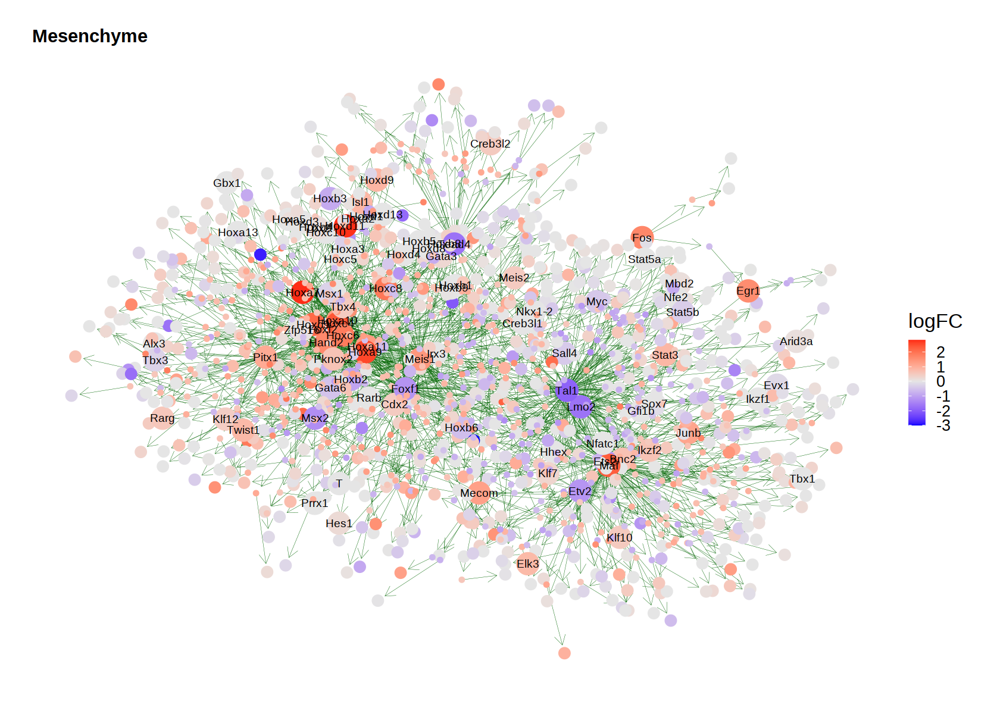

In [37]:
ct_keep = c( 'Primitive_Streak', 'Nascent_mesoderm', 'Mixed_mesoderm', 'ExE_mesoderm', 'Haematoendothelial_progenitors',  'Allantois','Endothelium','Intermediate_mesoderm',  'Mesenchyme')
options(repr.plot.width=14, repr.plot.height=10)
lapply(ct_keep, plotDGRN, DAR_logFC=0.5, DEG_logFC=1, keep_all=FALSE )

In [116]:
celltype_i = 'Endothelium'

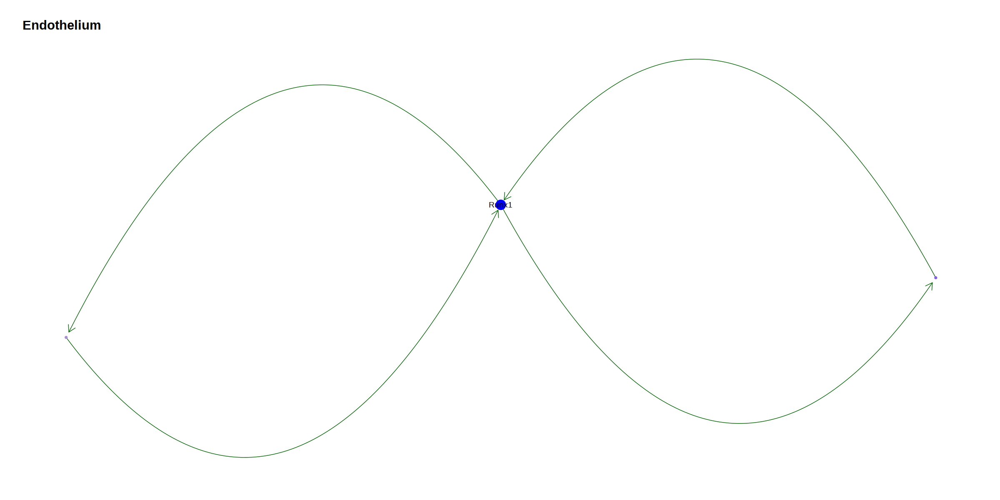

In [117]:
 DARs_tmp = DARs[celltype == celltype_i, c('feature', 'logFC', 'sig')]
    DEGs_tmp = DEGs[celltype == celltype_i, c('gene', 'logFC', 'sig')]
    scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] & Region %in% DARs_tmp[sig==TRUE, feature]] %>%
        .[TF %in% .[,.N,by="TF"][N>=3,TF]] # keep only TFs with 3 or more targets differential

    scenic_eGRN_tmp = scenic_eGRN_tmp[Gene == 'Runx1']

    TF_region = scenic_eGRN_tmp[,c('TF', 'Region', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
    region_gene = scenic_eGRN_tmp[,c('Region', 'Gene', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
    edges = rbind(TF_region, region_gene)
    
    DAR_DEGs = rbind(DARs_tmp, DEGs_tmp, use.names=FALSE) %>% setnames('feature', 'node')
    
    edges_tmp = edges[node %in% c(DARs_tmp$feature, DEGs_tmp$gene)] %>%
    unique(by=c('node', 'target'))
    
    
    nodes_tmp = data.table(node = unique(c(edges_tmp$node, edges_tmp$target))) %>%
    .[,type:=ifelse(node %in% scenic_eGRN$TF, 'TF', ifelse(node %in% scenic_eGRN$Region, 'Region', 'gene'))] %>%
    merge(.,DAR_DEGs, by='node', all.x=TRUE) %>%
    .[,logFC:=ifelse(is.na(logFC), 0, logFC)]
    
    igraph.tbl = tbl_graph(edges = edges_tmp, nodes = nodes_tmp)
    
    options(repr.plot.width=20, repr.plot.height=10)

    ggraph(igraph.tbl, 'stress') +
    # Edges
        geom_edge_fan(edge_color = 'darkgreen', edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(3,'mm'), show.legend = T) + 
    # nodes
        geom_node_point(aes(color=logFC, size=ifelse(type=='TF', 10, ifelse(type=='Region', 3, 5)))) + 
        scale_colour_gradient2(low='blue', mid='gray', high='red') +
        geom_node_text(aes(filter=type!='Region', label=node)) +
    ggtitle(celltype_i) + 
    theme_graph() + 
    theme(legend.position='none',
        text=element_text(size=20)) 

In [118]:
scenic_eGRN_tmp

V1,Region_signature_name,Gene_signature_name,TF,is_extended,Region,Gene,R2G_importance,R2G_rho,R2G_importance_x_rho,R2G_importance_x_abs_rho,TF2G_importance,TF2G_regulation,TF2G_rho,TF2G_importance_x_abs_rho,TF2G_importance_x_rho,Consensus_name
<int>,<chr>,<chr>,<chr>,<lgl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>
127,Runx1_+_(349r),Runx1_+_(320g),Runx1,FALSE,chr16:92801439-92802039,Runx1,0.07144813,0.6190625,0.04423086,0.04423086,98.31466,1,1,98.31466,98.31466,Runx1_+_+
128,Runx1_+_(349r),Runx1_+_(320g),Runx1,FALSE,chr16:92822085-92822685,Runx1,0.09072374,0.5978023,0.05423486,0.05423486,98.31466,1,1,98.31466,98.31466,Runx1_+_+


In [123]:
plotDGRN_runx1 = function(celltype_i){
    DARs_tmp = DARs[celltype == celltype_i, c('feature', 'logFC', 'sig')]
    DEGs_tmp = DEGs[celltype == celltype_i, c('gene', 'logFC', 'sig')]
    scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] | Region %in% DARs_tmp[sig==TRUE, feature]] %>%
        .[TF %in% .[,.N,by="TF"][N>=3,TF]] # keep only TFs with 3 or more targets differential
    
    scenic_eGRN_tmp = scenic_eGRN_tmp[Gene=='Runx1']
    
    TF_region = scenic_eGRN_tmp[,c('TF', 'Region', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
    region_gene = scenic_eGRN_tmp[,c('Region', 'Gene', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
    edges = rbind(TF_region, region_gene)
    
    DAR_DEGs = rbind(DARs_tmp, DEGs_tmp, use.names=FALSE) %>% setnames('feature', 'node')
    
    edges_tmp = edges[node %in% c(DARs_tmp$feature, DEGs_tmp$gene)] %>%
    unique(by=c('node', 'target'))
    
    
    nodes_tmp = data.table(node = unique(c(edges_tmp$node, edges_tmp$target))) %>%
    .[,type:=ifelse(node %in% scenic_eGRN$TF, 'TF', ifelse(node %in% scenic_eGRN$Region, 'Region', 'gene'))] %>%
    merge(.,DAR_DEGs, by='node', all.x=TRUE) %>%
    .[,logFC:=ifelse(is.na(logFC), 0, logFC)]
    
    igraph.tbl = tbl_graph(edges = edges_tmp, nodes = nodes_tmp)
    
    options(repr.plot.width=20, repr.plot.height=10)

    ggraph(igraph.tbl, 'stress') +
    # Edges
        geom_edge_fan(edge_color = 'darkgreen', edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(3,'mm'), show.legend = T) + 
    # nodes
        geom_node_point(aes(color=logFC, size=ifelse(type=='TF', 10, ifelse(type=='Region', 3, 5)))) + 
        scale_colour_gradient2(low='blue', mid='gray', high='red') +
        geom_node_text(aes(filter=type!='Region', label=node)) +
    ggtitle(celltype_i) + 
    theme_graph() + 
    theme(legend.position='none',
        text=element_text(size=20)) 
        
}

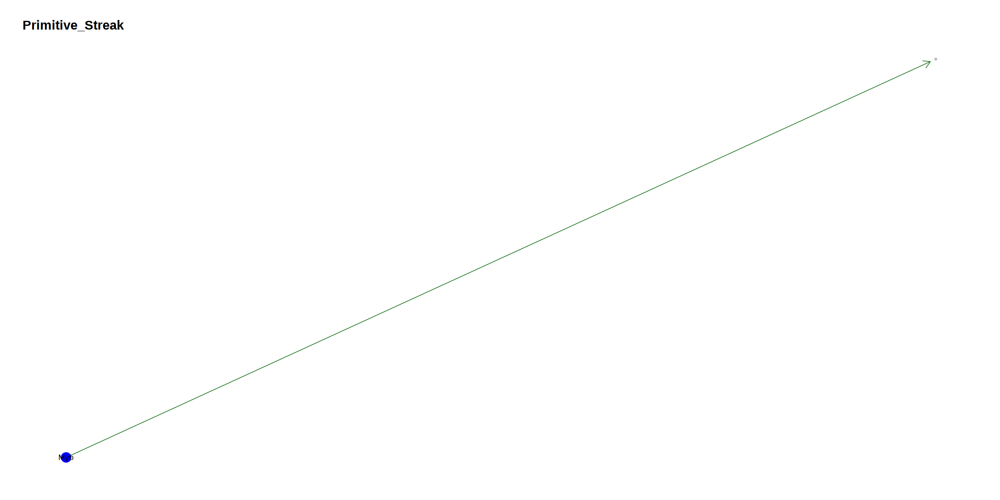

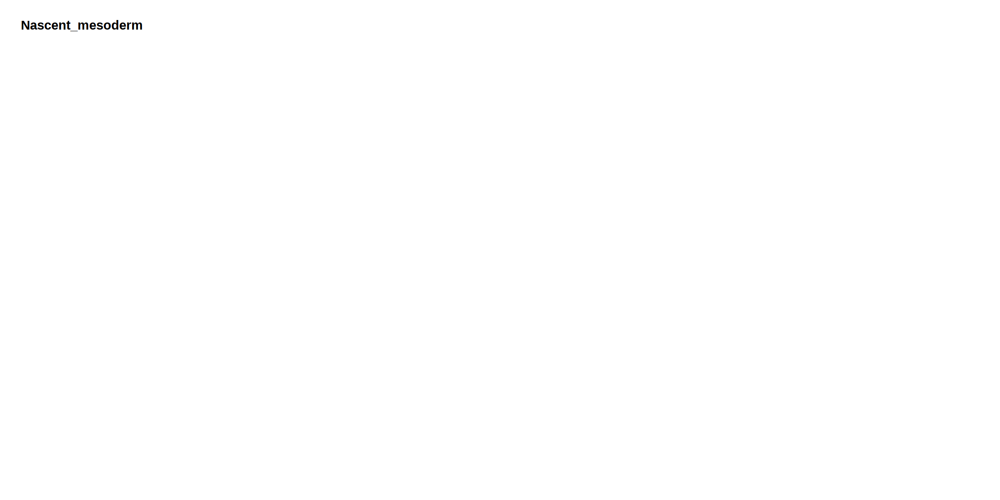

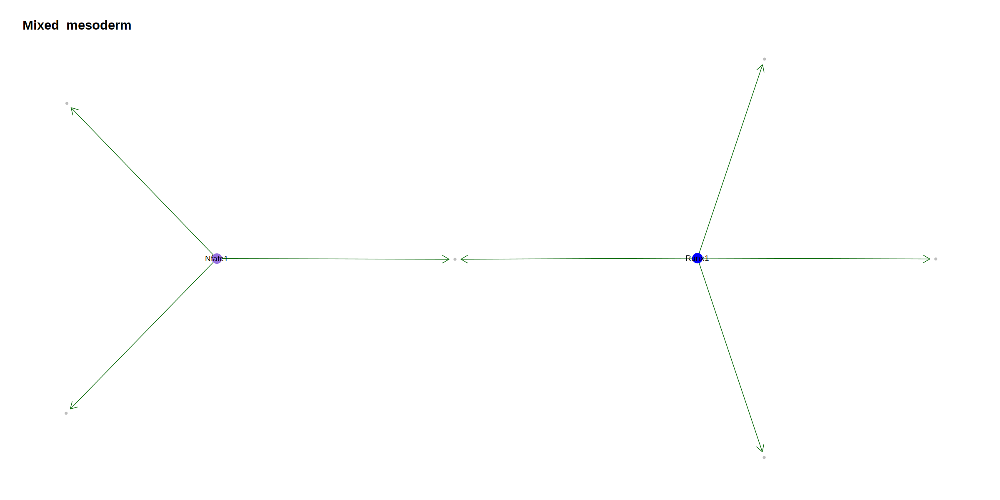

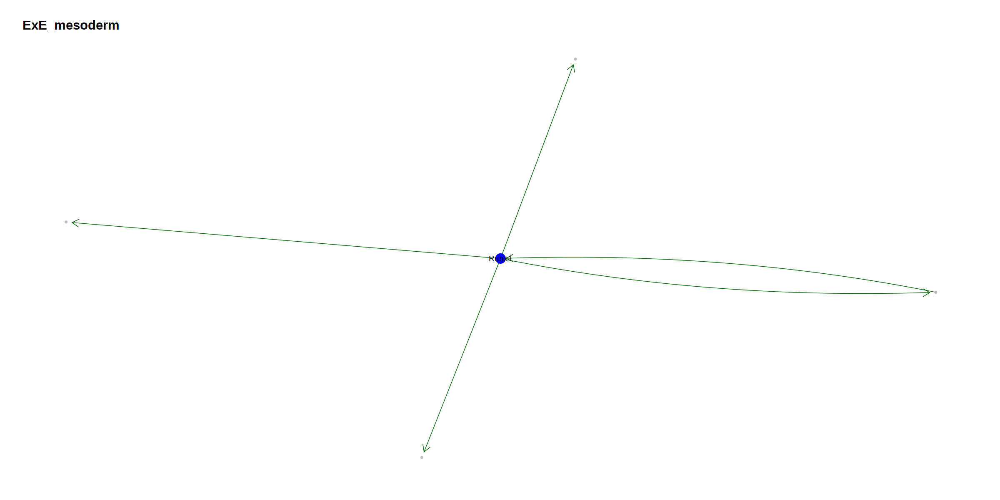

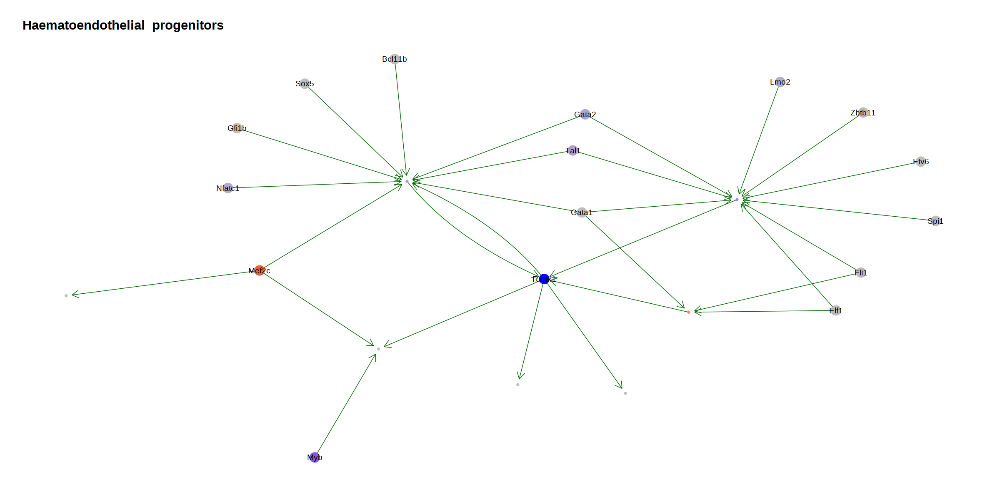

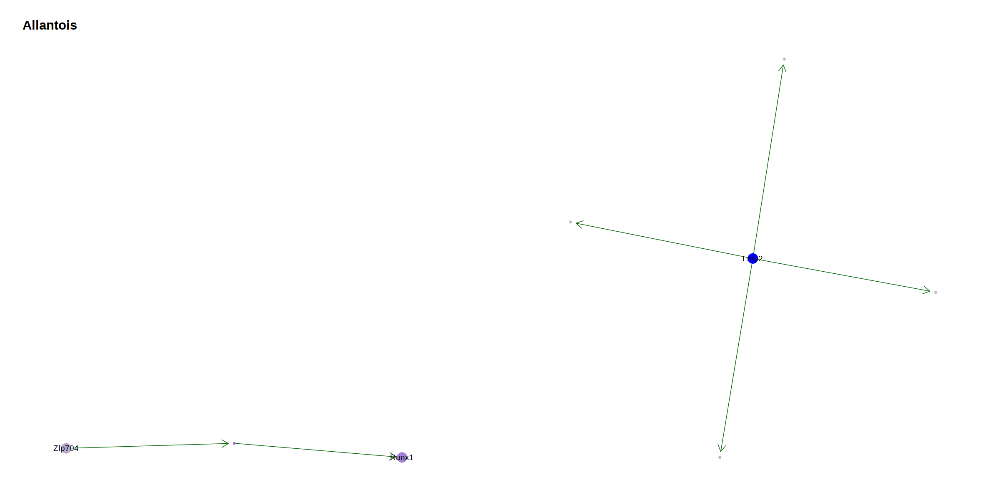

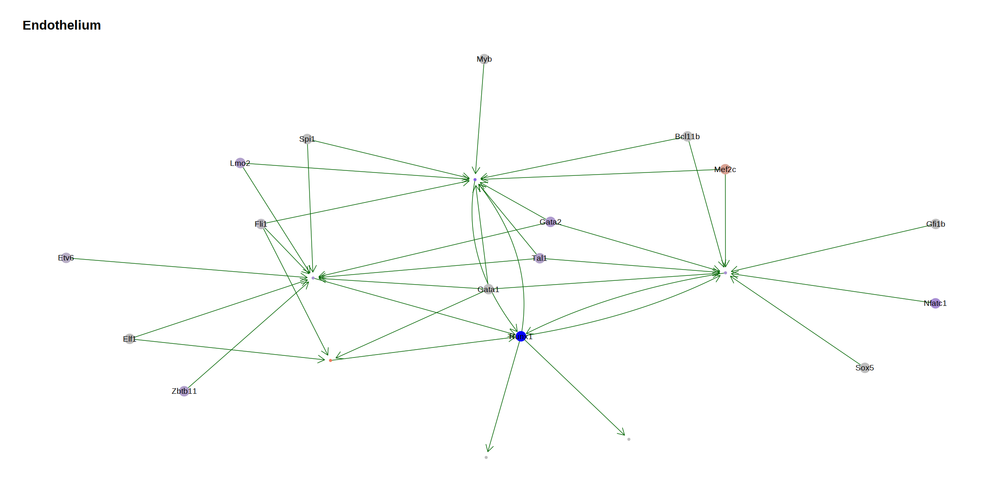

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]


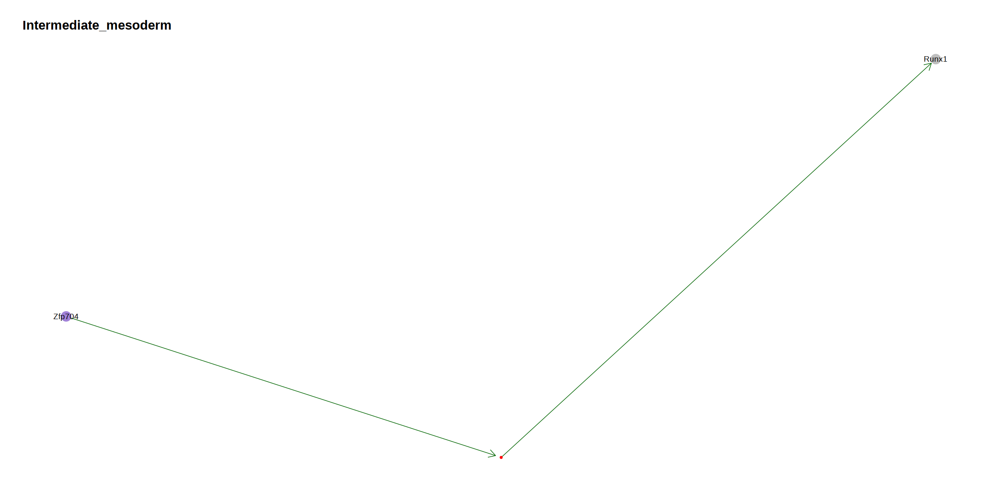

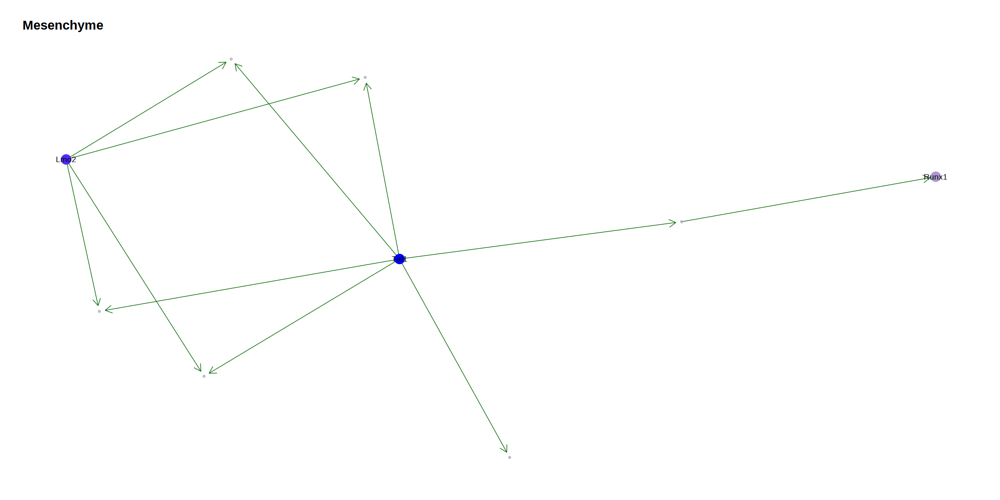

In [124]:
ct_keep = c( 'Primitive_Streak', 'Nascent_mesoderm', 'Mixed_mesoderm', 'ExE_mesoderm', 'Haematoendothelial_progenitors',  'Allantois','Endothelium','Intermediate_mesoderm',  'Mesenchyme')
lapply(ct_keep, plotDGRN_runx1)

In [127]:
endo_DARs = DARs[celltype=='Endothelium' & sig==TRUE]

In [131]:
fwrite(endo_DARs, file.path(io$basedir, 'results/FYR_figures/Endothelium_DARs.csv'))

In [128]:
io$basedir

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/09_Eomes_invitro_blood"

In [132]:
celltype_i = 'Endothelium'

In [133]:
DARs_tmp = DARs[celltype == celltype_i, c('feature', 'logFC', 'sig')]
DEGs_tmp = DEGs[celltype == celltype_i, c('gene', 'logFC', 'sig')]
scenic_eGRN_tmp = scenic_eGRN[TF %in% DEGs_tmp[sig==TRUE, gene] & Region %in% DARs_tmp[sig==TRUE, feature]] %>%
    .[TF %in% .[,.N,by="TF"][N>=3,TF]] # keep only TFs with 3 or more targets differential

TF_region = scenic_eGRN_tmp[,c('TF', 'Region', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
region_gene = scenic_eGRN_tmp[,c('Region', 'Gene', 'TF2G_rho')] %>% setnames(c('node', 'target', 'TF2G_rho'))
edges = rbind(TF_region, region_gene)

DAR_DEGs = rbind(DARs_tmp, DEGs_tmp, use.names=FALSE) %>% setnames('feature', 'node')

edges_tmp = edges[node %in% c(DARs_tmp$feature, DEGs_tmp$gene)] %>%
unique(by=c('node', 'target'))


nodes_tmp = data.table(node = unique(c(edges_tmp$node, edges_tmp$target))) %>%
.[,type:=ifelse(node %in% scenic_eGRN$TF, 'TF', ifelse(node %in% scenic_eGRN$Region, 'Region', 'gene'))] %>%
merge(.,DAR_DEGs, by='node', all.x=TRUE) %>%
.[,logFC:=ifelse(is.na(logFC), 0, logFC)]

In [134]:
test = merge(edges_tmp, nodes_tmp, by='node', keep.all=TRUE)

In [136]:
fwrite(test, file.path(io$basedir, 'results/FYR_figures/Endothelium_network.csv'))